In [3]:
!pip install catboost

In [0]:
import pandas as pd 
import numpy as np 
from tqdm import tqdm
import math
import gc
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error
import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostRegressor
import matplotlib.pyplot as plt

In [0]:
# ! cp data/Train_target.csv ./raw_data/Train_target.csv
# ! cp data/Test_target.csv ./raw_data/Test_target.csv

In [0]:
train=pd.read_csv("Train.csv")
test=pd.read_csv("Test.csv")

In [0]:
train.loc[train.location == 'A', 'location'] = 0
train.loc[train.location == 'B', 'location'] = 1
train.loc[train.location == 'C', 'location'] = 2
train.loc[train.location == 'D', 'location'] = 3
train.loc[train.location == 'E', 'location'] = 4
test.loc[test.location == 'A', 'location'] = 0
test.loc[test.location == 'B', 'location'] = 1
test.loc[test.location == 'C', 'location'] = 2
test.loc[test.location == 'D', 'location'] = 3
test.loc[test.location == 'E', 'location'] = 4

In [0]:
# covert features  from string to List of values 
def replace_nan(x):
    if x==" ":
        return np.nan
    else :
        return float(x)
features=["temp","precip","rel_humidity","wind_dir","wind_spd","atmos_press"]
for feature in features :
    train[feature]=train[feature].apply(lambda x: [ replace_nan(X) for X in x.replace("nan"," ").split(",")])
    test[feature]=test[feature].apply(lambda x: [ replace_nan(X)  for X in x.replace("nan"," ").split(",")])    

In [0]:
def aggregate_features(x,col_name):
    x["max_"+col_name]=x[col_name].apply(np.max)
    x["min_"+col_name]=x[col_name].apply(np.min)
    x["mean_"+col_name]=x[col_name].apply(np.mean)
    x["std_"+col_name]=x[col_name].apply(np.std)
    x["var_"+col_name]=x[col_name].apply(np.var)
    x["median_"+col_name]=x[col_name].apply(np.median)
    x["ptp_"+col_name]=x[col_name].apply(np.ptp)
    return x  
def remove_nan_values(x):
    return [e for e in x if not math.isnan(e)]

In [117]:
data=pd.concat([train,test],sort=False).reset_index(drop=True)
data.columns.tolist()

['ID',
 'location',
 'temp',
 'precip',
 'rel_humidity',
 'wind_dir',
 'wind_spd',
 'atmos_press',
 'target']

In [118]:
 for col_name in tqdm(features):
    data[col_name]=data[col_name].apply(remove_nan_values)

100%|██████████| 6/6 [00:03<00:00,  1.99it/s]


In [119]:
for col_name in tqdm(features):
    data=aggregate_features(data,col_name)

100%|██████████| 6/6 [00:19<00:00,  3.32s/it]


In [0]:
train=data[data.target.notnull()].reset_index(drop=True)
test=data[data.target.isna()].reset_index(drop=True)

In [121]:
del data  
gc.collect()

103

In [122]:
train = train.drop(['wind_dir'], axis = 1)
test = test.drop(['wind_dir'], axis = 1)
train['temp_1'] = [k[:25] for k in train['temp']]
train['precip_1'] = [k[:25] for k in train['precip']]
train['rel_humidity_1'] = [k[:25] for k in train['rel_humidity']]
train['wind_spd_1'] = [k[:25] for k in train['wind_spd']]
train['atmos_press_1'] = [k[:25] for k in train['atmos_press']]
train['density_1'] = np.array(list(map(lambda x: np.mean(x),[k[:25] for k in train['atmos_press']])))*10**2/(1.38*6.022*np.array(list(map(lambda x: np.mean(x),[k[:25] for k in train['temp']]))))
test['temp_1'] = [k[:25] for k in test['temp']]
test['precip_1'] = [k[:25] for k in test['precip']]
test['rel_humidity_1'] = [k[:25] for k in test['rel_humidity']]
test['wind_spd_1'] = [k[:25] for k in test['wind_spd']]
test['atmos_press_1'] = [k[:25] for k in test['atmos_press']]
test['density_1'] = np.array(list(map(lambda x: np.mean(x),[k[:25] for k in test['atmos_press']])))*10**2/(1.38*6.022*np.array(list(map(lambda x: np.mean(x),[k[:25] for k in test['temp']]))))
for i in range(1,5):
  train['temp_' + str(i+1)] = [k[24*i+1:24*i+26] for k in train['temp']]
  train['precip_' + str(i+1)] = [k[24*i+1:24*i+26] for k in train['precip']]
  train['rel_humidity_' + str(i+1)] = [k[24*i+1:24*i+26] for k in train['rel_humidity']]
  train['wind_spd_' + str(i+1)] = [k[24*i+1:24*i+26] for k in train['wind_spd']]
  train['atmos_press_' + str(i+1)] = [k[24*i+1:24*i+26] for k in train['atmos_press']]
  train['density_' + str(i+1)]  = np.array(list(map(lambda x: np.mean(x),[k[24*i+1:24*i+26] for k in train['atmos_press']])))*10**2/(1.38*6.022*np.array(list(map(lambda x: np.mean(x),[k[24*i+1:24*i+26] for k in train['temp']]))))
for i in range(1,5):
  test['temp_' + str(i+1)] = [k[24*i+1:24*i+26] for k in test['temp']]
  test['precip_' + str(i+1)] = [k[24*i+1:24*i+26] for k in test['precip']]
  test['rel_humidity_' + str(i+1)] = [k[24*i+1:24*i+26] for k in test['rel_humidity']]
  test['wind_spd_' + str(i+1)] = [k[24*i+1:24*i+26] for k in test['wind_spd']]
  test['atmos_press_' + str(i+1)] = [k[24*i+1:24*i+26] for k in test['atmos_press']]
  test['density_' + str(i+1)]  = np.array(list(map(lambda x: np.mean(x),[k[24*i+1:24*i+26] for k in test['atmos_press']])))*10**2/(1.38*6.022*np.array(list(map(lambda x: np.mean(x),[k[24*i+1:24*i+26] for k in test['temp']]))))
test = test.drop(['temp', 'precip', 'rel_humidity', 'wind_spd', 'atmos_press'], axis = 1)
train = train.drop(['temp', 'precip', 'rel_humidity', 'wind_spd', 'atmos_press'], axis = 1)

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [0]:
test['target'] = 0

In [0]:
def rnd(a):
  if a%5 >=2.5:
    a+=(5-a%5)
  else:
    a-=a%5
  return a
def rnd_spd(a):
  if a%0.5 >=0.25:
    a+=(0.5-a%0.5)
  else:
    a-=a%0.5
  return a
def func_app(x):
  r = x
  for i in range(45,70,6):
    if r[i] == []:
      r[i] = np.nan
    else:
      g = list(pd.Series(([rnd(k) for k in r[i]])).mode())
      r[i] = g[0]
  for i in range(46,71,6):
    if r[i] == []:
      r[i] = np.nan
    else:
      r[i] = np.max(r[i])
  for i in range(47,72,6):
    if r[i] == []:
      r[i] = np.nan
    else:
      r[i] = np.mean(r[i])
  for i in range(48,73,6):
    if r[i] == []:
      r[i] = np.nan
    else:
      g = list(pd.Series(([rnd_spd(k) for k in r[i]])).mode())
      r[i] = g[0]
  for i in range(49,74,6):
    if r[i] == []:
      r[i] = np.nan
    else:
      r[i] = np.mean(r[i])
  return r
train = train.apply(func_app, axis = 1)
test = test.apply(func_app, axis = 1)

In [0]:
for day in range(1,6):
  for location in range(5):
    true_value = train.groupby('location').agg({'temp_'+str(day): 'mean'}).reset_index()
    train.loc[train.location == location, 'temp_'+str(day)] = train.loc[train.location == location, 'temp_'+str(day)].fillna(rnd(true_value.loc[true_value.location == location, 'temp_'+str(day)].values[0]))
    precip = train.loc[train.location==location, 'precip_'+str(day)].dropna().mean()
    train.loc[train.location == location, 'precip_'+str(day)] = train.loc[train.location == location, 'precip_'+str(day)].fillna(float(precip))
    humidity = train.loc[train.location==location, 'rel_humidity_'+str(day)].dropna().mean()
    train.loc[train.location == location, 'rel_humidity_'+str(day)] = train.loc[train.location == location, 'rel_humidity_'+str(day)].fillna(float(humidity))
    press = train.loc[train.location==location, 'atmos_press_'+str(day)].dropna().mean()
    train.loc[train.location == location, 'atmos_press_'+str(day)] = train.loc[train.location == location, 'atmos_press_'+str(day)].fillna(float(press))
    spd = train.loc[train.location==location, 'wind_spd_'+str(day)].dropna().mode()
    train.loc[train.location == location, 'wind_spd_'+str(day)] = train.loc[train.location == location, 'wind_spd_'+str(day)].fillna(float(spd))
    density = train.loc[train.location==location, 'density_'+str(day)].dropna().mean()
    train.loc[train.location == location, 'density_'+str(day)] = train.loc[train.location == location, 'density_'+str(day)].fillna(float(density))

In [0]:
for day in range(1,6):
  for location in range(5):
    true_value = test.groupby('location').agg({'temp_'+str(day): 'mean'}).reset_index()
    test.loc[test.location == location, 'temp_'+str(day)] = test.loc[test.location == location, 'temp_'+str(day)].fillna(rnd(true_value.loc[true_value.location == location, 'temp_'+str(day)].values[0]))
    precip = test.loc[test.location==location, 'precip_'+str(day)].dropna().mean()
    test.loc[test.location == location, 'precip_'+str(day)] = test.loc[test.location == location, 'precip_'+str(day)].fillna(float(precip))
    humidity = test.loc[test.location==location, 'rel_humidity_'+str(day)].dropna().mean()
    test.loc[test.location == location, 'rel_humidity_'+str(day)] = test.loc[test.location == location, 'rel_humidity_'+str(day)].fillna(float(humidity))
    press = test.loc[test.location==location, 'atmos_press_'+str(day)].dropna().mean()
    test.loc[test.location == location, 'atmos_press_'+str(day)] = test.loc[test.location == location, 'atmos_press_'+str(day)].fillna(float(press))
    spd = test.loc[test.location==location, 'wind_spd_'+str(day)].dropna().mode()
    test.loc[test.location == location, 'wind_spd_'+str(day)] = test.loc[test.location == location, 'wind_spd_'+str(day)].fillna(float(spd))
    density = test.loc[test.location==location, 'density_'+str(day)].dropna().mean()
    test.loc[test.location == location, 'density_'+str(day)] = test.loc[test.location == location, 'density_'+str(day)].fillna(float(density))

In [0]:
trainaway = pd.read_csv('trainaway.csv')
testaway = pd.read_csv('testaway.csv')

In [0]:
train = train.merge(trainaway.drop(['location', 'target'], axis = 1).iloc[:,:-39], on = 'ID')
test = test.merge(testaway.drop(['location', 'target'], axis = 1).iloc[:,:-39], on = 'ID')

In [0]:
train = train.iloc[:,:-3]
test = test.iloc[:,:-3]

In [0]:
df = pd.DataFrame(columns = ['ID', 'target'])

In [134]:
#BEST_SCORE=model_lgb = lgb.LGBMRegressor(n_estimators=900, max_depth=9, learning_rate=0.2)\
for location in train.location.unique():
  y_pred_totcb2=[]
  fold=KFold(n_splits=15)
  X = train.loc[train.location == location].drop(['target'], axis = 1).iloc[:,1:]
  y = train.loc[train.location == location].target
  X_test_new = test.loc[test.location == location].drop(["target"],axis = 1).iloc[:,1:]
  test_id  = test.loc[test.location == location]['ID']
  print('Location', location)
  for train_index, test_index in fold.split(X,y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    model_lgb = lgb.LGBMRegressor(n_estimators=900, max_depth=9, learning_rate=0.2)
    model_lgb.fit(X_train, y_train)
    y_pred_lgb = model_lgb.predict(X_test)
    print('LGB =', np.sqrt(mean_squared_error(y_test, y_pred_lgb)))
    p2 = model_lgb.predict(X_test_new)
    y_pred_totcb2.append(p2)
  newdf = pd.DataFrame({'ID': test_id, 'target': np.mean(y_pred_totcb2, 0)})
  df = pd.concat([df, newdf])

Location 2
LGB = 39.604913370511724
LGB = 41.98405535252896
LGB = 38.476630760913494
LGB = 40.32105913808099
LGB = 41.34661748949646
LGB = 41.61832594267739
LGB = 37.65771050348957
LGB = 32.67021324766112
LGB = 35.17390988546833
LGB = 40.95061464311925
LGB = 36.918211745964165
LGB = 44.21787713825803
LGB = 41.185684541315844
LGB = 38.704253466876445
LGB = 47.06855786191089
Location 3
LGB = 16.96288977932266
LGB = 16.89933807000673
LGB = 21.015828250462437
LGB = 16.803361665632302
LGB = 17.0854363461227
LGB = 18.476897877607296
LGB = 17.01641260309805
LGB = 19.668363704914935
LGB = 15.794160729898556
LGB = 17.85066926707328
LGB = 17.969293471670248
LGB = 17.935994433790373
LGB = 21.01144476554643
LGB = 17.62131590578809
LGB = 20.850227919619655
Location 0
LGB = 29.03078573750198
LGB = 30.188410790962514
LGB = 31.834581461912794
LGB = 34.618070584652514
LGB = 27.63961811933838
LGB = 29.666750813225775
LGB = 30.576855057565602
LGB = 31.11726515739263
LGB = 30.473888975046545
LGB = 26.2387

In [135]:
df.head(10)

,ID,target
0,ID_test_0,148.819229
1,ID_test_1,82.315862
3,ID_test_100,69.782654
7,ID_test_1003,46.254777
10,ID_test_1006,40.619644
12,ID_test_1008,53.851684
14,ID_test_101,159.629056
29,ID_test_1023,138.145573
32,ID_test_1026,157.808407
37,ID_test_1030,166.816126


In [0]:
df.to_csv('submit_AIRQ.csv', index = False)

In [94]:
from sklearn.model_selection import KFold,StratifiedKFold, TimeSeriesSplit
from sklearn.metrics import mean_squared_error
for location in train.location.unique():
  print('Location', location)
  errcb2=[]
  y_pred_totcb2=[]
  fold=KFold(n_splits=15)#15#5#10
  X = train.loc[train.location == location].drop(['target'], axis = 1).iloc[:,1:]
  y = train.loc[train.location == location].target
  X_test_new = test.loc[test.location == location].drop(["target"],axis = 1).iloc[:,1:].fillna(0)
  test_id  = test.loc[test.location == location]['ID']
  for train_index, test_index in fold.split(X,y):
      X_train, X_test = X.iloc[train_index], X.iloc[test_index]
      y_train, y_test = y.iloc[train_index], y.iloc[test_index]
      m2  = CatBoostRegressor(n_estimators=900,eval_metric='RMSE',learning_rate=0.2, use_best_model=True )
      m2.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test, y_test)], early_stopping_rounds=200,verbose=100,)#erly100
      preds=m2.predict(X_test)
      print("err: ",np.sqrt(mean_squared_error(y_test,preds)))
      errcb2.append(np.sqrt(mean_squared_error(y_test,preds)))
      p2 = m2.predict(X_test_new)
      y_pred_totcb2.append(p2)
  newdf = pd.DataFrame({'ID': test_id, 'target': np.mean(y_pred_totcb2, 0)})
  df = pd.concat([df, newdf])
  np.mean(errcb2)

Location 2
0:	learn: 70.0306315	test: 70.0306315	test1: 66.8902800	best: 66.8902800 (0)	total: 16.6ms	remaining: 14.9s
100:	learn: 31.7366666	test: 31.7366666	test1: 46.5355795	best: 46.5355795 (100)	total: 1.24s	remaining: 9.78s
200:	learn: 22.7311852	test: 22.7311852	test1: 44.2192299	best: 44.1527191 (187)	total: 2.47s	remaining: 8.58s
300:	learn: 17.7544022	test: 17.7544022	test1: 43.0599432	best: 42.9753122 (296)	total: 3.71s	remaining: 7.38s
400:	learn: 14.4978915	test: 14.4978915	test1: 42.2185398	best: 42.1092467 (374)	total: 4.93s	remaining: 6.13s
500:	learn: 12.0489620	test: 12.0489620	test1: 41.8423824	best: 41.8097943 (477)	total: 6.16s	remaining: 4.9s
600:	learn: 10.1772521	test: 10.1772521	test1: 41.7841315	best: 41.7382124 (533)	total: 7.39s	remaining: 3.67s
700:	learn: 8.7625725	test: 8.7625725	test1: 41.6890527	best: 41.6544266 (698)	total: 8.66s	remaining: 2.46s
800:	learn: 7.5589970	test: 7.5589970	test1: 41.7006608	best: 41.6506714 (708)	total: 9.89s	remaining: 1.22

In [95]:
df.head()

,ID,target
0,ID_test_0,72.621684
1,ID_test_1,215.255933
3,ID_test_100,160.662766
7,ID_test_1003,123.073213
10,ID_test_1006,107.609458


In [137]:
new_df = pd.read_csv('submit_AQ.csv')
new_df = new_df.rename(columns = {'target': 'target_old'})
new_df.head()

,ID,target_old
0,ID_test_0,156.294613
1,ID_test_1,89.705453
2,ID_test_10,27.950536
3,ID_test_100,72.247640
4,ID_test_1000,88.227268


In [0]:
def MN(x):
  r = x
  r[-1] = (r[2]+r[3])/2
  return r

In [0]:
old_df = df

In [142]:
mean_df = df.merge(new_df, on = 'ID')
mean_df['mean'] = (mean_df.target + mean_df.target_old)/2
mean_df['new'] = 0.
mean_df = mean_df.apply(MN, axis = 1).drop(['target', 'target_old'], axis = 1).rename(columns = {'new': 'target'})
mean_df.head()

,ID,target
0,ID_test_0,152.556921
1,ID_test_1,86.010658
2,ID_test_100,71.015147
3,ID_test_1003,43.753814
4,ID_test_1006,37.036169


In [0]:
mean_df.to_csv('submit_aqo.csv', index = False)

In [0]:
def podgon(x):
  r = x
  if r[-1]>130:
    r[-1] = r[-1]/1.3
  return r

In [0]:
fresh.iloc[:10]

,ID,target
0,ID_test_0,126.888466
1,ID_test_1,72.788284
2,ID_test_10,22.734550
3,ID_test_100,58.697496
4,ID_test_1000,71.746645
5,ID_test_1001,38.498109
6,ID_test_1002,66.526389
7,ID_test_1003,33.640811
8,ID_test_1004,26.854731
9,ID_test_1005,43.275820


In [0]:
target_new = df.target

In [0]:
fresh = pd.read_csv('fresh.csv')
y_pred_cat = fresh.target
fresh = fresh.rename(columns ={'target':'target_old'})
fresh = fresh.merge(df, on = 'ID')
np.sqrt(mean_squared_error(target_new, y_pred_cat))

50.39245654248332

In [0]:
submit = pd.read_csv('submit.csv').rename(columns = {'target': 'target_sub'})
fresh = fresh.merge(submit, on='ID')

In [0]:
fresh['mean'] = (y_pred_cat + target_new)/2

In [0]:
1)target_old
2)target
3)target_sub
4)mean(target_old,target_sub)

In [0]:
fresh['tg'] = 0

In [0]:
def MN(x):
  r = x
  r[-1] = (r[2]+r[3])/2
  return r
fresh = fresh.apply(MN, axis = 1)
fresh.head()

,ID,target_old,target,mean,tg
0,ID_test_0,164.563132,153.538440,159.050786,156.294613
1,ID_test_1,96.539732,87.427360,91.983546,89.705453
2,ID_test_10,27.165895,28.212083,27.688989,27.950536
3,ID_test_100,73.798607,71.730651,72.764629,72.247640
4,ID_test_1000,86.602266,88.768935,87.685601,88.227268


In [0]:
fresh.drop(['target_old',	'target',	'mean'], axis = 1).rename(columns = {'tg': 'target'}).to_csv('submit_AQ.csv', index = False)

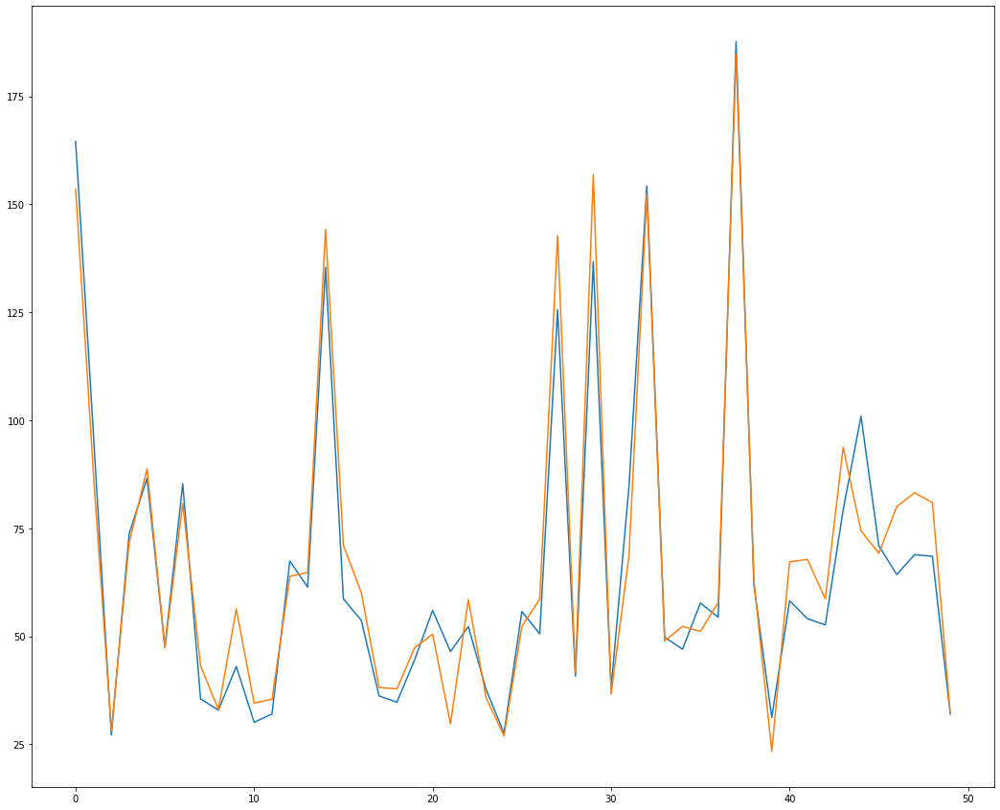

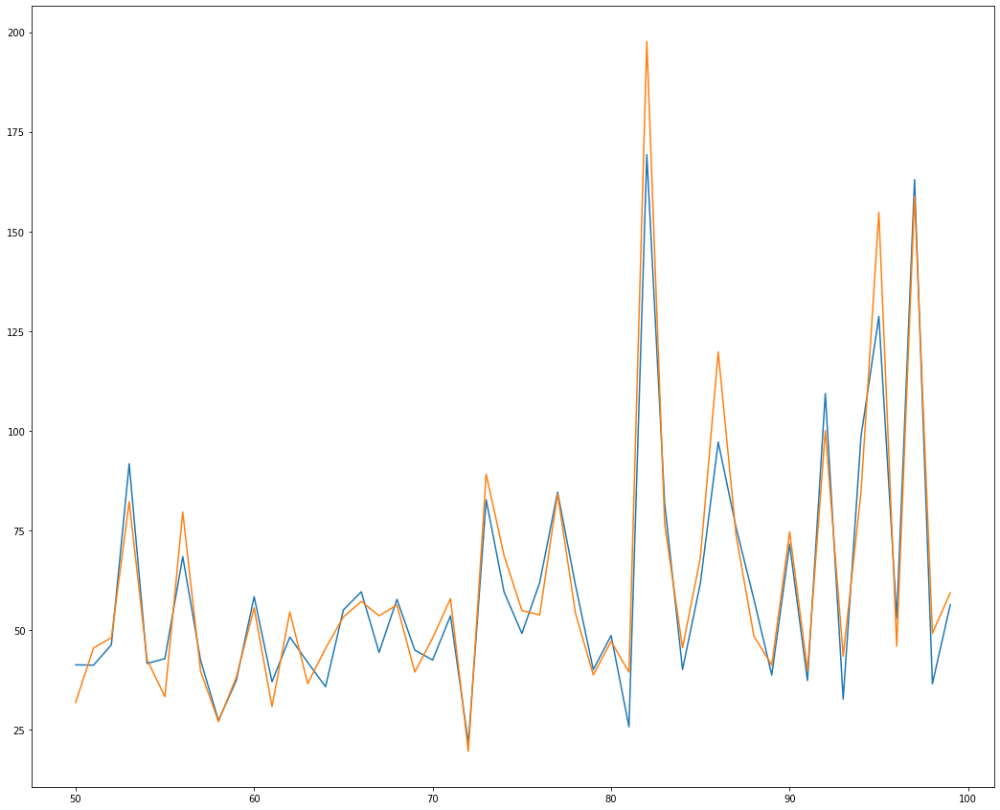

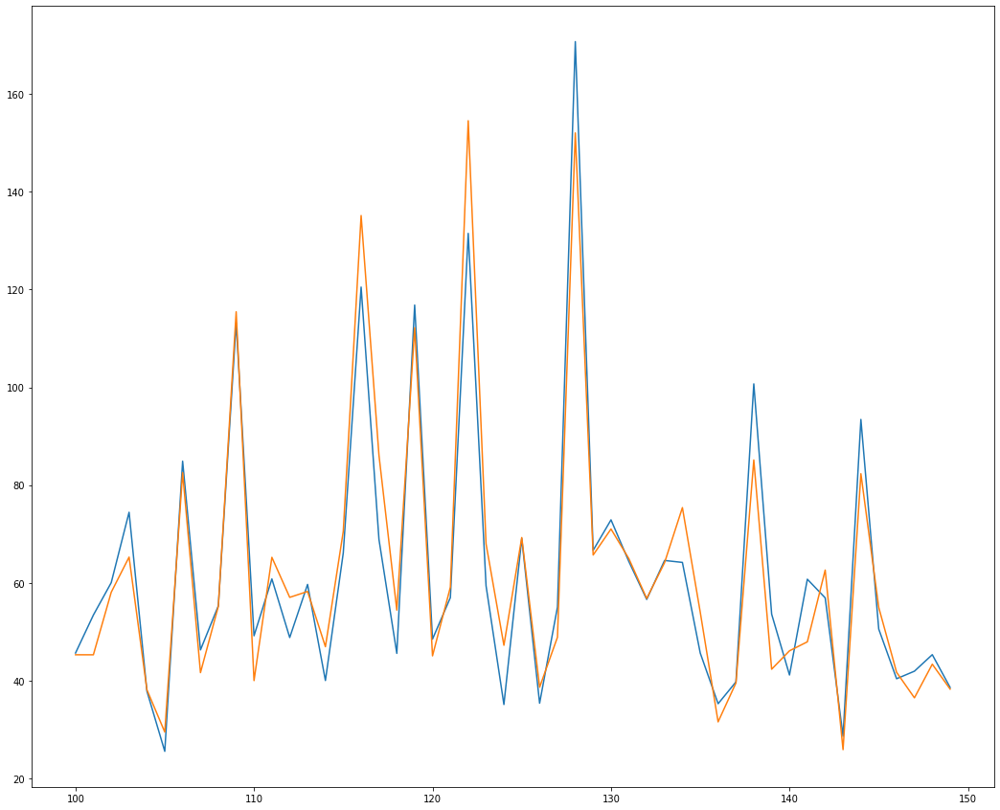

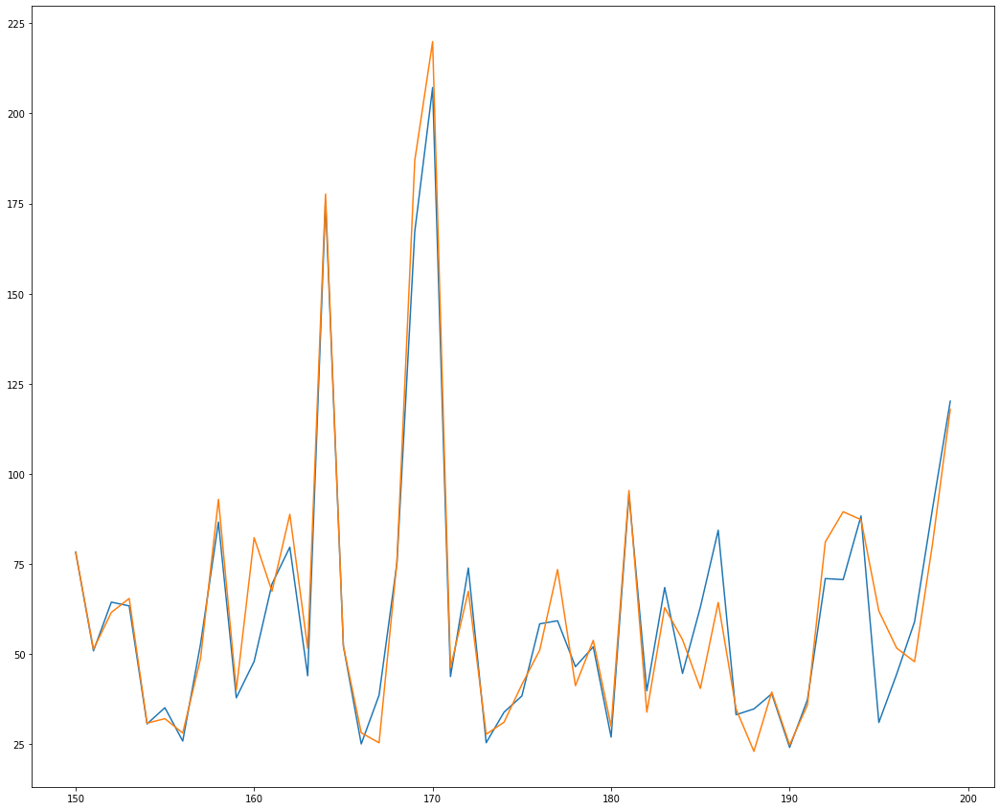

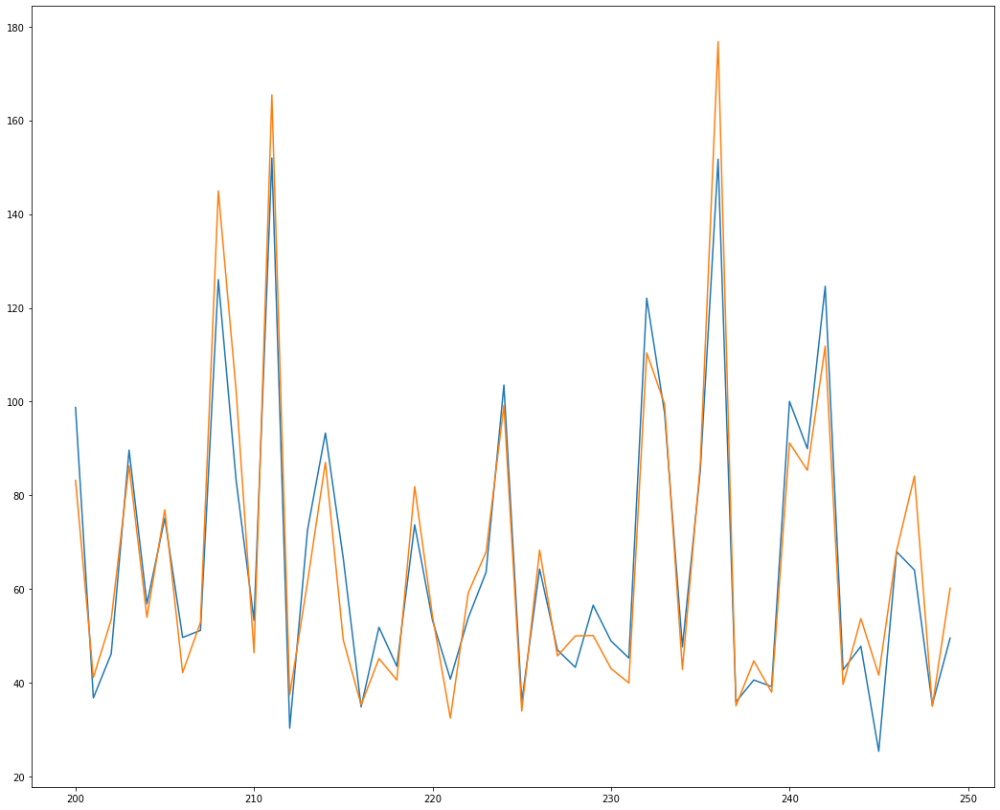

...

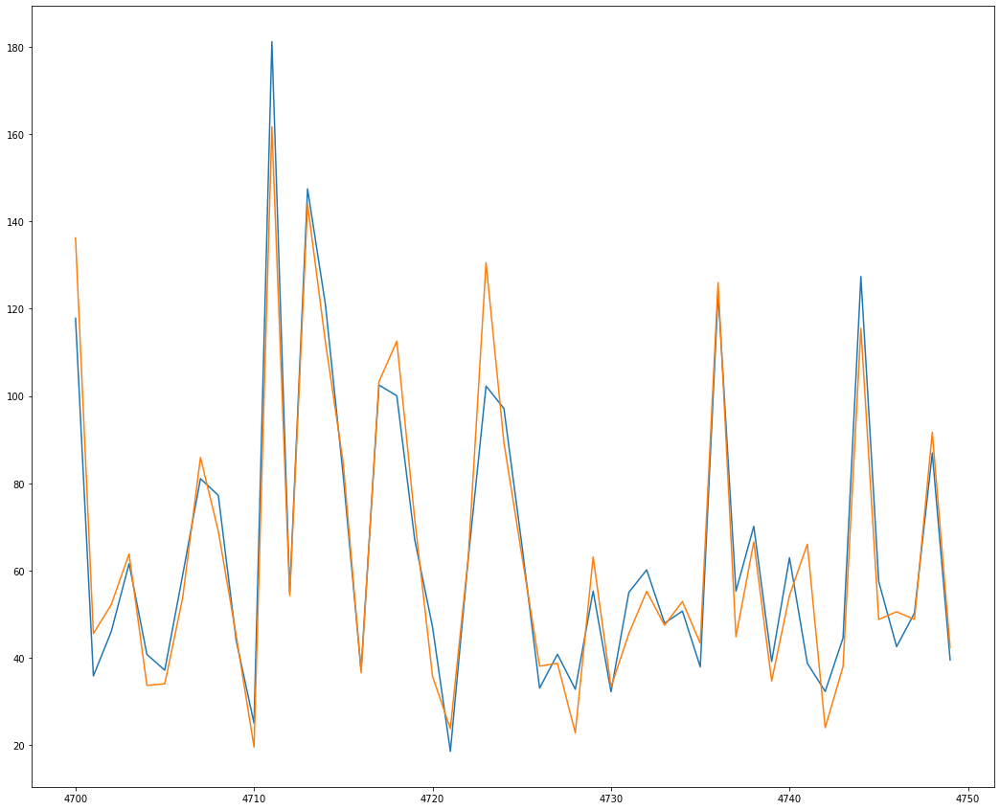

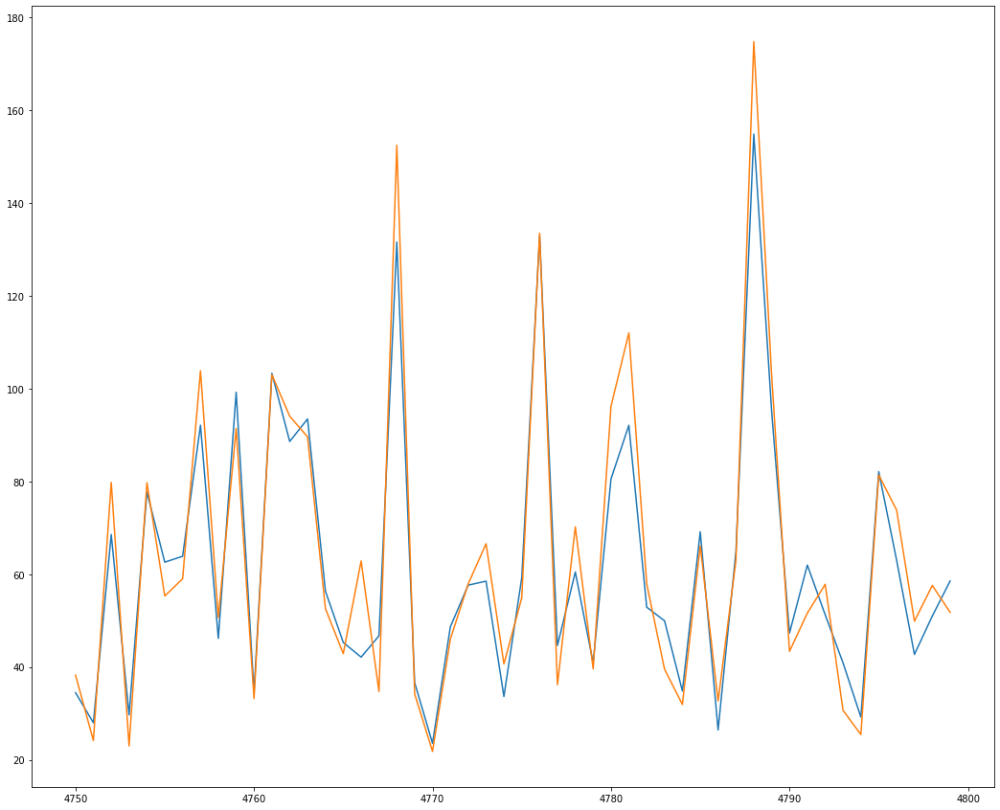

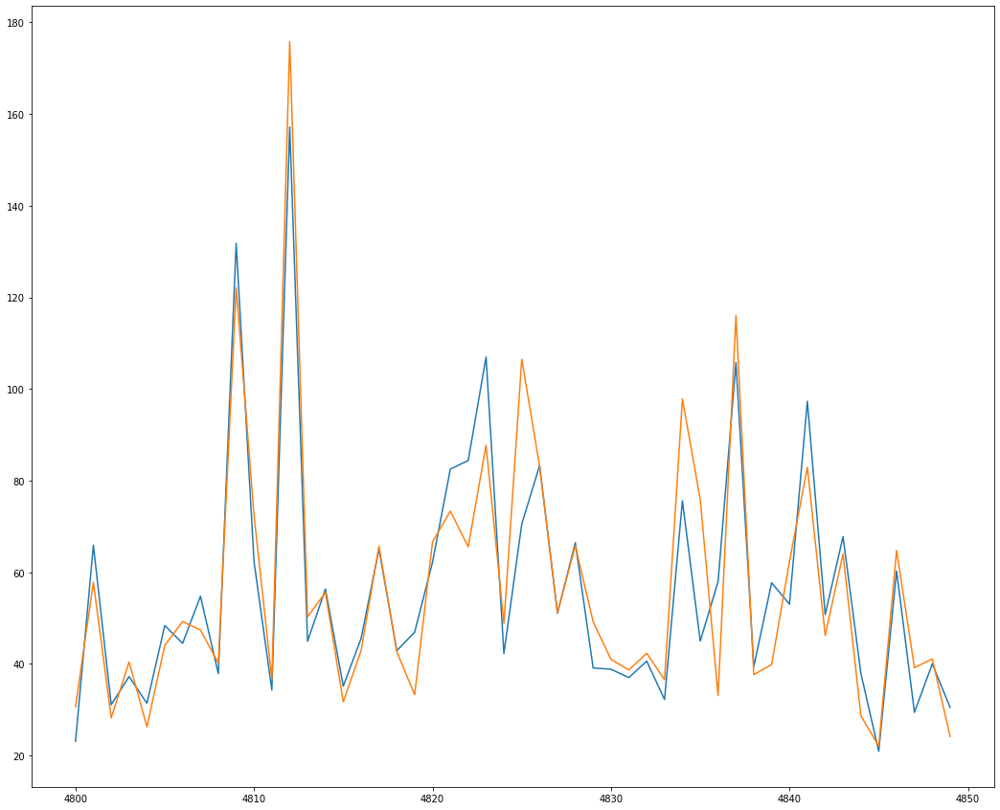

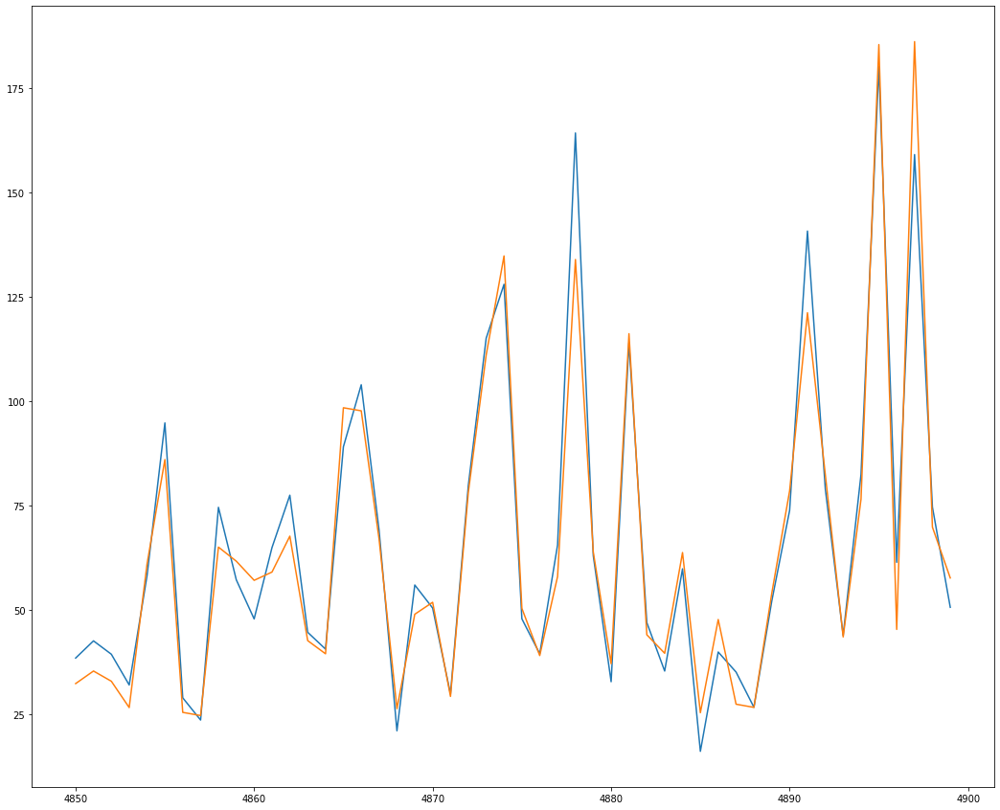

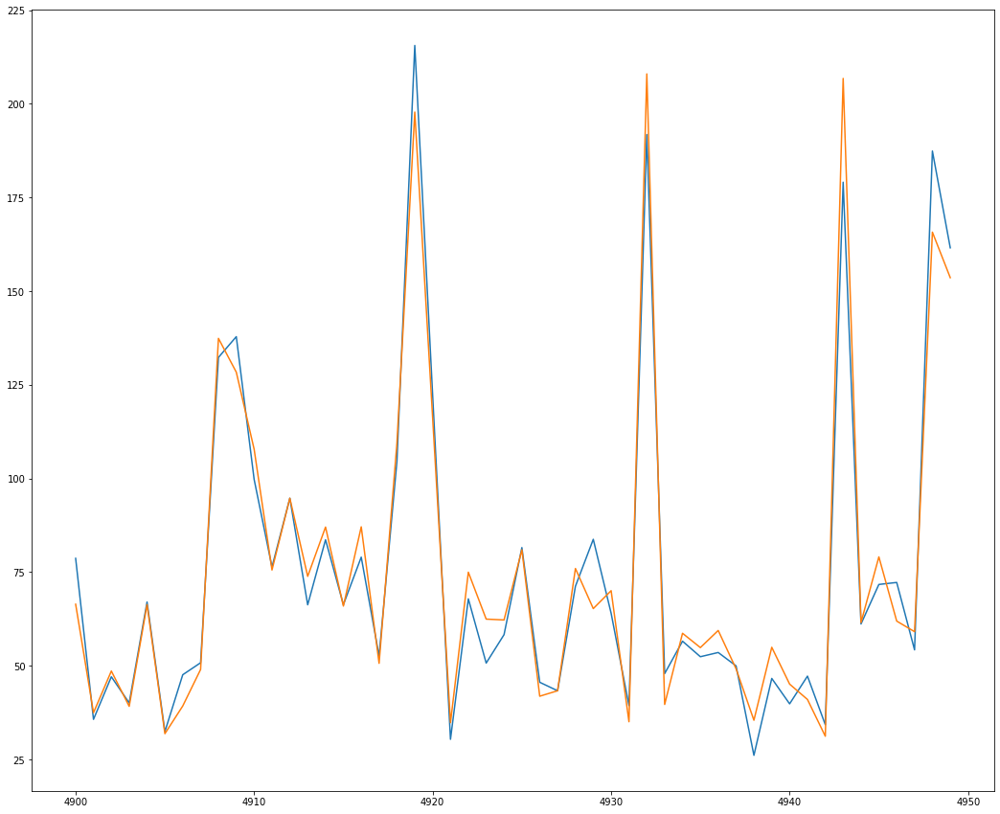

In [0]:
for i in range(50,5000,50):
  figure = plt.figure(figsize=(18,15))
  plt.plot(fresh.iloc[i-50:i].target_old)
  plt.plot(fresh.iloc[i-50:i].target)
  #plt.plot(fresh.iloc[:50]['mean'])
  plt.show()

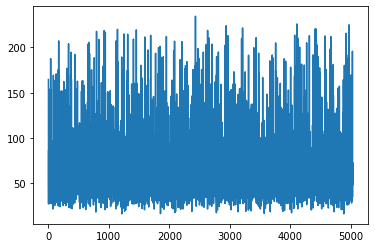

In [0]:
fresh.target_old.plot()

In [0]:
def line(x):
  r = x
  if np.abs(r[1]-r[2])>20 or np.abs(r[1]-r[3])>20 or np.abs(r[2]-r[3])>20:
    print(r)
fresh.apply(line, axis = 1)

ID            ID_test_1023
target_old         136.713
target             156.834
target_sub          165.91
mean               156.834
Name: 29, dtype: object
ID            ID_test_1025
target_old         84.6587
target             68.6713
target_sub         61.7175
mean               68.6713
Name: 31, dtype: object
ID            ID_test_1037
target_old         100.959
target             74.4603
target_sub         75.5975
mean               74.4603
Name: 44, dtype: object
ID            ID_test_1071
target_old         169.275
target             197.631
target_sub         185.236
mean               197.631
Name: 82, dtype: object
ID            ID_test_1075
target_old         97.1918
target             119.787
target_sub          135.76
mean               119.787
Name: 86, dtype: object
ID            ID_test_1083
target_old         128.746
target              154.78
target_sub          153.91
mean                154.78
Name: 95, dtype: object
ID            ID_test_1107
target_old         

0       None
1       None
2       None
3       None
4       None
        ... 
5030    None
5031    None
5032    None
5033    None
5034    None
Length: 5035, dtype: object

In [0]:
fresh['target'] = (y_pred_cat + target_new)/2.3
fresh.to_csv('subs_new.csv', index = False)
fresh.head()

,ID,target
0,ID_test_0,126.888466
1,ID_test_1,72.788284
2,ID_test_10,22.734550
3,ID_test_100,58.697496
4,ID_test_1000,71.746645


In [0]:
y_pred_cat = fresh.target

In [0]:
np.sqrt(mean_squared_error(target_new, y_pred_cat))

28.312507111520524

In [0]:
df.to_csv('submit.csv', index = False)

In [0]:
newdf = df.apply(podgon, axis = 1)
newdf.to_csv('submit.csv', index = False)
newdf.head(20)

,ID,target
0,ID_test_0,168.892284
1,ID_test_1,96.170097
3,ID_test_100,78.903716
7,ID_test_1003,47.477777
10,ID_test_1006,38.023836
12,ID_test_1008,70.288157
14,ID_test_101,158.647825
29,ID_test_1023,172.517861
32,ID_test_1026,167.650471
37,ID_test_1030,203.144070


In [0]:
df.to_csv('subs.csv', index = False)

In [0]:
d = {'ID': test_id, 'target': np.mean(y_pred_totcb2, 0)}
sub_cat = np.mean(y_pred_totcb2, 0)
sub = pd.DataFrame(data=d)
sub = sub[['ID', 'target']]

In [0]:
sub.target.min(),sub.target.max()

(15.734105481512273, 235.90013428555093)

In [0]:
sub.head(20)

,ID,target
0,ID_test_0,139.006979
1,ID_test_1,100.727211
2,ID_test_10,69.516539
3,ID_test_100,42.319925
4,ID_test_1000,32.196714
5,ID_test_1001,65.064515
6,ID_test_1002,118.377622
7,ID_test_1003,137.506076
8,ID_test_1004,150.633718
9,ID_test_1005,175.436032


In [0]:
sub.head(20)

,ID,target
0,ID_test_0,149.222391
1,ID_test_1,97.591939
2,ID_test_10,28.350782
3,ID_test_100,81.563361
4,ID_test_1000,90.817051
5,ID_test_1001,49.886619
6,ID_test_1002,80.895210
7,ID_test_1003,42.194920
8,ID_test_1004,33.091785
9,ID_test_1005,49.023878


In [0]:
np.sqrt(mean_squared_error(y_pred_cat, sub_cat))

48.87039835866353

In [0]:
y_cat = sub.target
sub['target'] = (y_pred_cat + y_cat)/2
sub.head()

,ID,target
0,ID_test_0,156.182503
1,ID_test_1,96.861241
2,ID_test_10,27.712533
3,ID_test_100,73.922018
4,ID_test_1000,87.949252


In [0]:
sub.to_csv("subm.csv",index  = False)

In [0]:
from sklearn.svm import SVR
model_svr = SVR(C=100)
model_svr.fit(X_train, y_train)
y_pred_svr = model_svr.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred_svr))

44.63520446612

In [0]:
data_test = test.drop(['target'],axis = 1)
test_value = data_test.iloc[:,1:]
y_pred = model_lgb.predict(test_value)
y_pred_svr = model_svr.predict(test_value)
test['target'] = (y_pred+y_pred_svr)/2
df = test[['ID', 'target']]
df = df.rename(columns = {'target': 'target_lgb'})
df.head()

,ID,target_lgb
0,ID_test_0,60.778374
1,ID_test_1,120.391234
2,ID_test_10,44.966548
3,ID_test_100,106.330113
4,ID_test_1000,79.302464


In [0]:
np.sqrt(mean_squared_error(y_pred_cat, (y_pred+y_pred_svr)/2))

31.050184445478855

In [0]:
y_pred_cat = fresh.target
y_pred_lgbm = fresh.target_lgb
y_mean = (y_pred_cat + y_pred_lgbm)/2
print('c, l =', np.sqrt(mean_squared_error(y_pred_cat, y_pred_lgbm)))
print('c, m =', np.sqrt(mean_squared_error(y_pred_lgbm, y_mean)))
print('l, m =', np.sqrt(mean_squared_error(y_pred_cat, y_mean)))

c, l = 31.050184445478855
c, m = 15.525092222739426
l, m = 15.525092222739428


In [0]:
fresh['target'] = (y_pred_cat + y_pred_svr)/2
fresh = fresh.drop(['target_lgb'], axis = 1)
fresh.head()

,ID,target
0,ID_test_0,102.974082
1,ID_test_1,69.809842
2,ID_test_10,35.738301
3,ID_test_100,61.146205
4,ID_test_1000,67.427460


In [0]:
df.to_csv('Submission.csv', index = False)

In [0]:
model_lgb = lgb.LGBMRegressor(n_estimators=400, max_depth=3, learning_rate=0.3)
model_lgb.fit(X_train, y_train)
y_pred_lgb = model_lgb.predict(X_test)
print('LGB =', np.sqrt(mean_squared_error(y_test, y_pred_lgb)))
model_xgb = xgb.XGBRegressor(n_estimators = 500,max_depth = 3, learning_rate = 0.3, objective = 'reg:squarederror')
model_xgb.fit(X_train, y_train)
y_pred_xgb = model_xgb.predict(X_test)
print('XGB =', np.sqrt(mean_squared_error(y_test, y_pred_xgb)))
y_pred_mean = (y_pred_lgb+y_pred_xgb)/2
print('Mean =', np.sqrt(mean_squared_error(y_test, y_pred_mean)))

LGB = 32.819074966241224
XGB = 33.299009400798596
Mean = 32.54508732193066


In [0]:
df.head()

,ID,target
0,ID_test_0,35.240982
1,ID_test_1,102.069091
2,ID_test_10,46.364751
3,ID_test_100,79.159361
4,ID_test_1000,60.627250


In [0]:
#Make Submission
df.to_csv('Submission.csv', index = False)

In [0]:
data_qo = pd.read_csv('airqo_metadata.csv')
data_qo['density'] = data_qo['popn'].values/data_qo['km2'].values
data_qo = data_qo.drop(['dist_motorway', 'hh', 'hh_burn_waste', 'hh_cook_charcoal', 'popn', 'dist_tertiary', 'dist_primary', 'dist_trunk', 'km2'], axis = 1)
data_qo.head()

,Unnamed: 0,location,loc_altitude,aspect,dist_secondary,dist_unclassified,dist_residential,hh_cook_firewood,density
0,0,A,1122.4,194.0,343.595039,330.609776,254.307415,43,2506.842105
1,1,B,1155.4,219.8,1144.376412,65.142004,1.042809,1144,4119.074074
2,2,C,1178.3,168.7,12.730489,406.967815,13.931350,751,11517.058824
3,3,D,980.8,90.0,NaN,76.024389,11.601442,651,4495.000000
4,4,E,1186.5,121.0,1738.872942,449.591885,3.836589,26,3790.000000


In [0]:
data_qo = data_qo.drop(['Unnamed: 0'], axis = 1)
data_qo.loc[data_qo.location == 'A', 'location'] = 0
data_qo.loc[data_qo.location == 'B', 'location'] = 1
data_qo.loc[data_qo.location == 'C', 'location'] = 2
data_qo.loc[data_qo.location == 'D', 'location'] = 3
data_qo.loc[data_qo.location == 'E', 'location'] = 4
data_qo = data_qo.fillna(5000)
data_qo.head()

,location,loc_altitude,aspect,dist_secondary,dist_unclassified,dist_residential,hh_cook_firewood,density
0,0,1122.4,194.0,343.595039,330.609776,254.307415,43,2506.842105
1,1,1155.4,219.8,1144.376412,65.142004,1.042809,1144,4119.074074
2,2,1178.3,168.7,12.730489,406.967815,13.931350,751,11517.058824
3,3,980.8,90.0,5000.000000,76.024389,11.601442,651,4495.000000
4,4,1186.5,121.0,1738.872942,449.591885,3.836589,26,3790.000000


In [0]:
merged_train = train.merge(data_qo, on='location')
merged_test = test.merge(data_qo, on='location')

In [0]:
data = merged_train.drop(['target'], axis = 1)
X = data.iloc[:,1:]
y = merged_train.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [0]:
model_lgb = lgb.LGBMRegressor(n_estimators=200, max_depth=6, learning_rate=0.3)
model_lgb.fit(X_train, y_train)
y_pred_lgb = model_lgb.predict(X_test)
print('LGB =', np.sqrt(mean_squared_error(y_test, y_pred_lgb)))
model_xgb = xgb.XGBRegressor(n_estimators = 900,max_depth = 9, learning_rate = 0.3, objective = 'reg:squarederror')
model_xgb.fit(X_train, y_train)
y_pred_xgb = model_xgb.predict(X_test)
print('XGB =', np.sqrt(mean_squared_error(y_test, y_pred_xgb)))
y_pred_mean = (y_pred_lgb+y_pred_xgb)/2
print('Mean =', np.sqrt(mean_squared_error(y_test, y_pred_mean)))

LGB = 31.52928877684011
XGB = 33.37691750331039
Mean = 31.692932886795905


In [0]:
model_lgb = lgb.LGBMRegressor()
parametrs = {'n_estimators': range(100, 1000, 200), 'max_depth': range(3,10,1), 'learning_rate': np.arange(0.01, 0.3, 0.01)}
grid_cv_lgb = GridSearchCV(model_lgb, parametrs, cv = 5, scoring='neg_mean_squared_error')
grid_cv_lgb.fit(X_train, y_train)
best_model_lgb = grid_cv_lgb.best_estimator_
y_pred_lgb = best_model_lgb.predict(X_test)
print('LGB =', np.sqrt(mean_squared_error(y_test, y_pred_lgb)))

KeyboardInterrupt: ignored

In [0]:
grid_cv_lgb.best_params_

{'max_depth': 9, 'n_estimators': 900}

In [0]:
model_xgb = xgb.XGBRegressor(objective = 'reg:squarederror')
parametrs = {'n_estimators': range(100, 1000, 200), 'max_depth': range(3,10,1)}
grid_cv_xgb = GridSearchCV(model_xgb, parametrs, cv = 5, scoring='neg_mean_squared_error')
grid_cv_xgb.fit(X_train, y_train)
best_model_xgb = grid_cv_xgb.best_estimator_
y_pred_xgb = best_model_xgb.predict(X_test)
print('XGB =', np.sqrt(mean_squared_error(y_test, y_pred_xgb)))

In [0]:
y_pred_xgb = best_model_xgb.predict(X_test)
print('XGB =', np.sqrt(mean_squared_error(y_test, y_pred_xgb)))

In [0]:
data_test = test.drop(['target'],axis = 1)
test_value = data_test.iloc[:,1:]
y_pred = (best_model_lgb.predict(test_value)+model_xgb.predict(test_value))/2.2
test['target'] = y_pred
df = test[['ID', 'target']]
df.head()

,ID,target
0,ID_test_0,48.656863
1,ID_test_1,135.294141
2,ID_test_100,165.545597
3,ID_test_1003,96.097564
4,ID_test_1006,111.569628


In [0]:
df.head()

,ID,target
0,ID_test_0,56.182620
1,ID_test_1,137.498953
2,ID_test_10,49.101293
3,ID_test_100,120.426299
4,ID_test_1000,72.564462


In [0]:
#Make Submission
df.to_csv('Submission.csv', index = False)

### Features engineering part

In [0]:
def aggregate_features(x,col_name):
    x["max_"+col_name]=x[col_name].apply(np.max)
    x["min_"+col_name]=x[col_name].apply(np.min)
    x["mean_"+col_name]=x[col_name].apply(np.mean)
    x["std_"+col_name]=x[col_name].apply(np.std)
    x["var_"+col_name]=x[col_name].apply(np.var)
    x["median_"+col_name]=x[col_name].apply(np.median)
    x["ptp_"+col_name]=x[col_name].apply(np.ptp)
    return x  
def remove_nan_values(x):
    return [e for e in x if not math.isnan(e)]


In [0]:
data=pd.concat([train,test],sort=False).reset_index(drop=True)
data.columns.tolist()

['ID',
 'location',
 'temp',
 'precip',
 'rel_humidity',
 'wind_dir',
 'wind_spd',
 'atmos_press',
 'target']

In [0]:
data.shape

(20574, 9)

In [0]:
 for col_name in tqdm(features):
    data[col_name]=data[col_name].apply(remove_nan_values)

100%|██████████| 6/6 [00:02<00:00,  2.53it/s]


In [0]:
for col_name in tqdm(features):
    data=aggregate_features(data,col_name)

100%|██████████| 6/6 [00:19<00:00,  3.32s/it]


In [0]:
data.drop(features,1,inplace=True)

In [0]:
train=data[data.target.notnull()].reset_index(drop=True)
test=data[data.target.isna()].reset_index(drop=True)

In [0]:
del data  
gc.collect()

93

In [0]:
train.head()

,ID,location,target,max_temp,min_temp,mean_temp,std_temp,var_temp,median_temp,ptp_temp,max_precip,min_precip,mean_precip,std_precip,var_precip,median_precip,ptp_precip,max_rel_humidity,min_rel_humidity,mean_rel_humidity,std_rel_humidity,var_rel_humidity,median_rel_humidity,ptp_rel_humidity,max_wind_dir,min_wind_dir,mean_wind_dir,std_wind_dir,var_wind_dir,median_wind_dir,ptp_wind_dir,max_wind_spd,min_wind_spd,mean_wind_spd,std_wind_spd,var_wind_spd,median_wind_spd,ptp_wind_spd,max_atmos_press,min_atmos_press,mean_atmos_press,std_atmos_press,var_atmos_press,median_atmos_press,ptp_atmos_press,fold_x,fold_y,fold
0,ID_train_0,C,45.126304,27.208333,19.275000,22.299527,2.594011,6.728895,21.358333,7.933333,0.000,0.0,0.000000,0.000000,0.000000,0.0,0.000,0.891500,0.510818,0.758530,0.120234,0.014456,0.806292,0.380682,345.726333,6.535299,209.574655,120.231802,14455.686315,220.039988,339.191034,1.517500,0.162500,0.677348,0.394041,0.155268,0.666250,1.355000,87.871667,87.614167,87.752434,0.070374,0.004952,87.762083,0.257500,3,3,3
1,ID_train_1,D,79.131702,33.616667,17.983333,24.679063,4.266955,18.206903,23.791667,15.633333,0.561,0.0,0.007025,0.051706,0.002673,0.0,0.561,0.979250,0.403083,0.758058,0.160952,0.025906,0.791000,0.576167,357.730286,3.543198,177.109855,96.802929,9370.807133,153.164843,354.187088,3.009167,0.248333,0.899208,0.539199,0.290736,0.744167,2.760833,90.725000,90.056667,90.429924,0.156000,0.024336,90.429167,0.668333,0,0,0
2,ID_train_10,A,32.661304,31.841667,18.458333,24.112317,3.776377,14.261020,23.304167,13.383333,7.804,0.0,0.151767,0.798401,0.637445,0.0,7.804,0.930333,0.376750,0.712944,0.168129,0.028267,0.766458,0.553583,357.265773,0.581510,201.373211,92.105195,8483.367004,208.901301,356.684263,2.751667,0.331667,1.038656,0.585221,0.342484,0.942500,2.420000,88.813333,87.982500,88.420931,0.179481,0.032213,88.425000,0.830833,1,1,1
3,ID_train_100,A,53.850238,27.491667,16.941667,20.845273,3.080140,9.487259,19.541667,10.550000,25.787,0.0,1.127273,3.739886,13.986750,0.0,25.787,0.999917,0.618750,0.898326,0.114207,0.013043,0.970167,0.381167,357.246718,3.092044,259.973977,114.240190,13050.821125,318.539747,354.154674,2.744167,0.275000,1.365202,0.580259,0.336701,1.388333,2.469167,88.685000,87.965000,88.376915,0.161758,0.026166,88.400000,0.720000,1,1,1
4,ID_train_1000,A,177.418750,28.750000,17.525000,21.870732,3.286870,10.803515,20.950000,11.225000,0.136,0.0,0.005100,0.024498,0.000600,0.0,0.136,0.957000,0.486417,0.785134,0.143001,0.020449,0.839792,0.470583,359.193111,10.772327,181.944779,125.337606,15709.515580,160.078536,348.420784,1.994167,0.197500,0.729763,0.426251,0.181690,0.542917,1.796667,88.719167,88.268333,88.538104,0.118369,0.014011,88.552500,0.450833,1,1,1


In [0]:
test.head()

,ID,location,target,max_temp,min_temp,mean_temp,std_temp,var_temp,median_temp,ptp_temp,max_precip,min_precip,mean_precip,std_precip,var_precip,median_precip,ptp_precip,max_rel_humidity,min_rel_humidity,mean_rel_humidity,std_rel_humidity,var_rel_humidity,median_rel_humidity,ptp_rel_humidity,max_wind_dir,min_wind_dir,mean_wind_dir,std_wind_dir,var_wind_dir,median_wind_dir,ptp_wind_dir,max_wind_spd,min_wind_spd,mean_wind_spd,std_wind_spd,var_wind_spd,median_wind_spd,ptp_wind_spd,max_atmos_press,min_atmos_press,mean_atmos_press,std_atmos_press,var_atmos_press,median_atmos_press,ptp_atmos_press
0,ID_test_0,C,NaN,26.858333,17.050000,21.389532,2.731833,7.462909,20.908333,9.808333,5.728,0.0,0.204165,0.880254,0.774846,0.0,5.728,0.999833,0.586083,0.842947,0.124179,0.015420,0.859250,0.413750,357.223551,7.092226,231.104760,83.856214,7031.864555,217.738239,350.131326,1.915833,0.171667,0.812555,0.392783,0.154279,0.767500,1.744167,88.020833,87.474167,87.748506,0.132764,0.017626,87.752500,0.546667
1,ID_test_1,C,NaN,26.991667,17.275000,21.302824,2.289268,5.240748,20.716667,9.716667,15.831,0.0,0.208719,1.517969,2.304229,0.0,15.831,0.999750,0.583167,0.830610,0.106384,0.011318,0.852000,0.416583,351.333059,6.290985,212.924101,91.254295,8327.346424,181.691165,345.042074,2.099167,0.210000,0.852562,0.456733,0.208605,0.771667,1.889167,88.181667,87.572500,87.936963,0.113756,0.012940,87.928333,0.609167
2,ID_test_10,D,NaN,29.850000,17.108333,22.144421,2.943047,8.661528,21.458333,12.741667,1.327,0.0,0.040190,0.164596,0.027092,0.0,1.327,0.986750,0.515167,0.868258,0.096427,0.009298,0.903750,0.471583,356.508481,2.279896,167.731590,98.024235,9608.750685,144.225803,354.228585,3.127500,0.237500,0.803140,0.569737,0.324600,0.567500,2.890000,90.785000,90.115000,90.521357,0.136316,0.018582,90.536667,0.670000
3,ID_test_100,C,NaN,27.325000,18.633333,22.361639,2.480003,6.150415,21.616667,8.691667,3.604,0.0,0.035686,0.328542,0.107940,0.0,3.604,0.983250,0.582583,0.792134,0.100795,0.010160,0.812000,0.400667,353.300228,0.125888,199.467348,106.904504,11428.572983,172.913664,353.174340,1.790000,0.215000,0.797528,0.430546,0.185370,0.685000,1.575000,88.078333,87.560000,87.754848,0.125583,0.015771,87.726667,0.518333
4,ID_test_1000,D,NaN,31.091667,16.908333,23.560243,4.136978,17.114585,22.825000,14.183333,0.000,0.0,0.000000,0.000000,0.000000,0.0,0.000,0.939091,0.467500,0.742784,0.132957,0.017678,0.763636,0.471591,357.394131,5.507766,188.649303,107.050126,11459.729472,165.312472,351.886365,2.045000,0.283333,0.811990,0.440297,0.193861,0.609091,1.761667,90.798333,90.105833,90.475030,0.161193,0.025983,90.487273,0.692500


#### Cross validation strategy (Kfold,or simple train test split )

In [0]:
Experiment_name="simple_model"

In [0]:
import os
os.makedirs("proc_data", exist_ok=True)
os.makedirs("model_save/lgbm/{}".format(Experiment_name), exist_ok=True)
os.makedirs("model_save/catboost/{}".format(Experiment_name), exist_ok=True)
os.makedirs("model_save/xgboost/{}".format(Experiment_name), exist_ok=True)

In [0]:
try : 
    folds=pd.read_csv("./proc_data/folds_id.csv")
    train=train.merge(folds,on="ID",how="left")
    train.fold.nunique()
except : 
    #  you run this cell  only for the first time 
    from sklearn.model_selection import KFold 
    kfold=KFold(n_splits=5,shuffle=True,random_state=2020) # change this random_state or all of you will have the same score  :D 
    train.reset_index(drop=True,inplace=True)
    folds=train[["ID"]].copy()
    folds["fold"]=0
    for fold,(tr_indx,val_ind) in enumerate(kfold.split(folds)) : 
        folds.loc[val_ind,"fold"]=fold
    folds.to_csv("./proc_data/folds_id.csv",index=False)
    train=train.merge(folds,on="ID",how="left")
    
    del folds

### Model 

### Lgbm 

In [0]:
train.columns

Index(['ID', 'location', 'target', 'max_temp', 'min_temp', 'mean_temp',
       'std_temp', 'var_temp', 'median_temp', 'ptp_temp', 'max_precip',
       'min_precip', 'mean_precip', 'std_precip', 'var_precip',
       'median_precip', 'ptp_precip', 'max_rel_humidity', 'min_rel_humidity',
       'mean_rel_humidity', 'std_rel_humidity', 'var_rel_humidity',
       'median_rel_humidity', 'ptp_rel_humidity', 'max_wind_dir',
       'min_wind_dir', 'mean_wind_dir', 'std_wind_dir', 'var_wind_dir',
       'median_wind_dir', 'ptp_wind_dir', 'max_wind_spd', 'min_wind_spd',
       'mean_wind_spd', 'std_wind_spd', 'var_wind_spd', 'median_wind_spd',
       'ptp_wind_spd', 'max_atmos_press', 'min_atmos_press',
       'mean_atmos_press', 'std_atmos_press', 'var_atmos_press',
       'median_atmos_press', 'ptp_atmos_press', 'fold_x', 'fold_y', 'fold'],
      dtype='object')

In [0]:
target_name="target"
id_name="ID"
features_to_remove=[target_name,id_name,"fold"]
features=train.columns.tolist()
features=[ fea for fea in  features if fea not in features_to_remove  ]
features

['location',
 'max_temp',
 'min_temp',
 'mean_temp',
 'std_temp',
 'var_temp',
 'median_temp',
 'ptp_temp',
 'max_precip',
 'min_precip',
 'mean_precip',
 'std_precip',
 'var_precip',
 'median_precip',
 'ptp_precip',
 'max_rel_humidity',
 'min_rel_humidity',
 'mean_rel_humidity',
 'std_rel_humidity',
 'var_rel_humidity',
 'median_rel_humidity',
 'ptp_rel_humidity',
 'max_wind_dir',
 'min_wind_dir',
 'mean_wind_dir',
 'std_wind_dir',
 'var_wind_dir',
 'median_wind_dir',
 'ptp_wind_dir',
 'max_wind_spd',
 'min_wind_spd',
 'mean_wind_spd',
 'std_wind_spd',
 'var_wind_spd',
 'median_wind_spd',
 'ptp_wind_spd',
 'max_atmos_press',
 'min_atmos_press',
 'mean_atmos_press',
 'std_atmos_press',
 'var_atmos_press',
 'median_atmos_press',
 'ptp_atmos_press',
 'fold_x',
 'fold_y']

In [0]:
from sklearn.metrics import mean_squared_error
def metric(y,x):
    return np.sqrt(mean_squared_error(x,y))

In [0]:
pip install catboost

     |████████████████████████████████| 64.4MB 60kB/s 


In [0]:
import  lightgbm as lgbm 
import xgboost as xgb 
import catboost as cat 

In [0]:
train.fold

0        3
1        0
2        1
3        1
4        1
        ..
15534    4
15535    3
15536    0
15537    4
15538    1
Name: fold, Length: 15539, dtype: int64

In [0]:
def train_function(model,train,test,params,other_params,target_name,features,metric):
    folds_num=train.fold.nunique()
    validation=train[[id_name,"fold",target_name]].copy()
    validation["pred_"+target_name]=0
    sub=test[[id_name]].copy()
    
    for fold in np.sort(train.fold.unique()):
        print("#"*50+" {} ".format(fold)+"#"*50)
        os.makedirs("model_save/lgbm/{}/{}".format(Experiment_name,str(int(fold))), exist_ok=True)
        X_train=train[train.fold!=fold]
        X_val=train[train.fold==fold]
        
        train_pred,validation_pred,test_pred=model(X_train,X_val,test,params,other_params)
        
        validation.loc[validation.fold==fold,"pred_"+target_name]=validation_pred
        sub[target_name]=test_pred/folds_num
        train_score=metric(X_train[target_name],train_pred)
        val_score=metric(X_val[target_name],validation_pred)
        print("train score : {} validation score : {}".format(round(train_score,4),round(val_score,4)))
    final_validation_score=metric(validation[target_name],validation["pred_"+target_name])
    print("final validation score : {}".format(final_validation_score))
        
    return sub,validation,final_validation_score

def lgbm_model(X_train,X_val,X_test,params,other_params):
    dtrain = lgbm.Dataset(data=X_train[features], label=X_train[target_name], feature_name=features)
    dval = lgbm.Dataset(data=X_val[features], label=X_val[target_name], feature_name=features)

    model = lgbm.train(
        params=params,
        train_set=dtrain,
        num_boost_round=other_params["num_boost_round"],
        valid_sets=(dtrain, dval),
        early_stopping_rounds=other_params["early_stopping_rounds"],
        verbose_eval=other_params["verbose_eval"],
    )        
    best_iteration = model.best_iteration
    train_pred=model.predict(X_train[features], num_iteration=best_iteration)
    validation_pred=model.predict(X_val[features], num_iteration=best_iteration)
    test_pred=model.predict(test[features], num_iteration=best_iteration)
        
    return train_pred,validation_pred,test_pred

In [0]:
other_params={"num_boost_round":50000000,
              "early_stopping_rounds":50,
              "verbose_eval":1000,
}
lgbm_params = {
    "bagging_fraction": 0.8,
    "bagging_freq": 2,
    "boosting_type": "gbdt",
    "feature_fraction": 0.8,
    "learning_rate": 0.01,
    "max_depth": 8,
    "num_threads": 16,
    "objective": "regression",
    "metric": "rmse",
    "seed": 2020,
}

In [0]:
sub,validation,score=train_function(model=lgbm_model,
                                    train=train,
                                    test=test,
                                    params=lgbm_params,
                                    other_params=other_params,
                                    target_name=target_name,
                                    features=features,
                                    metric=metric)

################################################## 0 ##################################################


ValueError: ignored

In [0]:
os.makedirs("subs", exist_ok=True)

In [0]:
sub.head()

,ID,target
0,ID_test_0,8.967140
1,ID_test_1,36.928166
2,ID_test_2,6.759933
3,ID_test_3,8.655477
4,ID_test_4,6.300573


In [0]:
sub.to_csv("./subs/lgbm_{}.csv".format(round(score,2)))